In [1]:
import pickle, pprint
import sys
import numpy as np
import uproot
import matplotlib.pyplot as plt
sys.path.append("/scratch/halmazan//WCTE/ACES")
import functions_spills
import functions_analysis

In [2]:
run_number = "2386"  # Run number
output_path = "/scratch/halmazan/WCTE/files/data/"

In [4]:
with open(f'{output_path}filtered_files/filtered_file_daqtime_{run_number}.pkl', 'rb') as f:
    data = pickle.load(f)

In [5]:
data

{'run_number': '2386',
 'nhits_threshold': 300,
 'nhits_window': 5000,
 'death_time': 6000,
 'threshold_times': {np.int32(0): [np.float64(135790.35307070313),
   np.float64(235222.61063378907),
   np.float64(246232.571090625)],
  np.int32(3): [np.float64(69825.16433445312)],
  np.int32(6): [np.float64(96395.76217988282)],
  np.int32(7): [np.float64(227169.97816328125)],
  np.int32(8): [np.float64(155671.97167890624)],
  np.int32(11): [np.float64(149061.15782148438)],
  np.int32(14): [np.float64(105897.11295117188)],
  np.int32(16): [np.float64(188635.29035390625)],
  np.int32(17): [np.float64(257082.5821466797)],
  np.int32(18): [np.float64(245073.0109158203),
   np.float64(256293.86823203124)],
  np.int32(20): [np.float64(99213.71381347656),
   np.float64(244394.95751542968)],
  np.int32(22): [np.float64(82188.47349691406)],
  np.int32(23): [np.float64(216269.46120898437)],
  np.int32(25): [np.float64(140571.95003671874)],
  np.int32(33): [np.float64(50847.646068125)],
  np.int32(34):

In [7]:
data["times_daq_TOF"]["values"]

array([5.90573302e+09, 5.90573321e+09, 5.90573390e+09, ...,
       1.34573405e+12, 1.34573405e+12, 1.34573405e+12], shape=(127751441,))

In [5]:
# Quick handles to flattened arrays + offsets
times_vals = data["times_TOF"]["values"]
times_offs = data["times_TOF"]["offsets"]
charge_vals = data["charge"]["values"]
charge_offs = data["charge"]["offsets"]
mpmt_vals = data["mpmt_id"]["values"]
mpmt_offs = data["mpmt_id"]["offsets"]
pmt_vals = data["pmt_id"]["values"]
pmt_offs = data["pmt_id"]["offsets"]

def unfold(values: np.ndarray, offsets: np.ndarray):
    # Returns a list of per-event arrays using the offsets
    return [values[int(offsets[i]):int(offsets[i+1])] for i in range(len(offsets) - 1)]

# Build per-event lists (this is the "second option" you wanted)
times_per_event  = unfold(times_vals,  times_offs)
charge_per_event = unfold(charge_vals, charge_offs)
mpmt_per_event   = unfold(mpmt_vals,   mpmt_offs)
pmt_per_event   = unfold(pmt_vals,   pmt_offs)

In [13]:
len(times_per_event)*max(times_per_event[0])


np.float64(29699516952.577904)

In [18]:
max(times_offs)

np.int64(127751441)

In [7]:
max(times_vals[0])

TypeError: 'numpy.float64' object is not iterable

In [14]:
# Concatenate all per-event arrays
all_times = np.concatenate(times_per_event)
all_charges = np.concatenate(charge_per_event)
all_mpmts = np.concatenate(mpmt_per_event)
all_pmt = np.concatenate(pmt_per_event)

# To add offsets to each time, build an array of per-hit offsets
# For each event, repeat the offset for the number of hits in that event
event_offsets = np.concatenate([
    np.full(len(ev), offset) for ev, offset in zip(times_per_event, times_offs)
])

# Now just add the offsets
times_run = all_times + event_offsets
charge_run = all_charges  # Already flat, nothing more is needed
mpmt_run = all_mpmts  # Already flat, nothing more is needed
pmt_run = all_pmt  # Already flat, nothing more is needed

In [17]:
times_run

array([4.07965631e+02, 6.05707600e+02, 1.29365159e+03, ...,
       1.27886898e+08, 1.27886954e+08, 1.27886995e+08], shape=(127751441,))

In [18]:
if not (len(times_run) == len(charge_run) == len(mpmt_run) == len(pmt_run)):
    raise ValueError(
        f"Arrays have mismatched lengths (times={len(times_event)}, "
        f"charge={len(charge_event)}, mpmt={len(mpmt_event)}, pmt={len(pmt_event)})"
    )

In [19]:
def nHitsTimeWindow(times_branch_event_arg, threshold_inf, window, death_window, charge_branch_event=[], threshold_sup=np.inf):
    times = np.sort(np.array(times_branch_event_arg).copy())
    threshold_times = []
    nhits_range = []

    n = len(times)
    start = 0
    end = 0
    i = 0

    while i < n:
        t0 = times[i]
        # Move 'end' to include all times within [t0, t0+window)
        while end < n and times[end] < t0 + window:
            end += 1

        # Compute count/charge in window
        if len(charge_branch_event) != 0:
            print("Charge")
            max_charge = np.max(charge_branch_event[i:end])
            count = max_charge
        else:
            count = end - i

        if count > threshold_inf and count < threshold_sup:
            threshold_times.append(t0)
            nhits_range.append(count)
            # Skip forward by death window
            # Find first index after t0+window+death_window
            skip_to = t0 + window + death_window
            while i < n and times[i] < skip_to:
                i += 1
            # Move end as well (since i advanced)
            end = max(end, i)
        else:
            i += 1

    return threshold_times, nhits_range

In [20]:
threshold_list,  nhits_list = nHitsTimeWindow(
    times_run,
    150,
    1500,
    0,
    threshold_sup=300,
)

In [23]:
threshold_list

[np.float64(26941.42042222656),
 np.float64(28442.37837246094),
 np.float64(29962.348229921874),
 np.float64(31467.209501367186),
 np.float64(33114.05612679687),
 np.float64(34618.39504609375),
 np.float64(36528.34269082031),
 np.float64(39881.653713125),
 np.float64(41397.673376796876),
 np.float64(42908.800611132814),
 np.float64(44409.526465625),
 np.float64(45912.00276953125),
 np.float64(47413.75078183594),
 np.float64(51672.69706289063),
 np.float64(53176.726690234376),
 np.float64(56368.53637480469),
 np.float64(57870.44215070312),
 np.float64(59375.90490332031),
 np.float64(127957073.59521957),
 np.float64(127959635.1236334),
 np.float64(127961146.44150332),
 np.float64(127965985.60263258),
 np.float64(127967506.12897949),
 np.float64(127969031.17065649),
 np.float64(127970532.12877266),
 np.float64(127972035.88802266),
 np.float64(127973538.28185079),
 np.float64(127975041.28450246),
 np.float64(127976548.66128288),
 np.float64(127978052.43968117),
 np.float64(127979552.610661

In [49]:
times_total_array = np.array(times_run, dtype=np.float64)

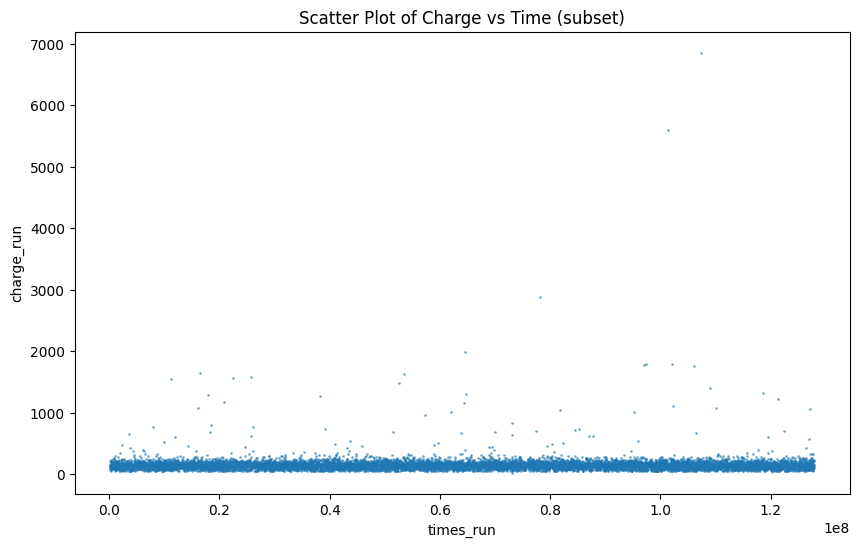

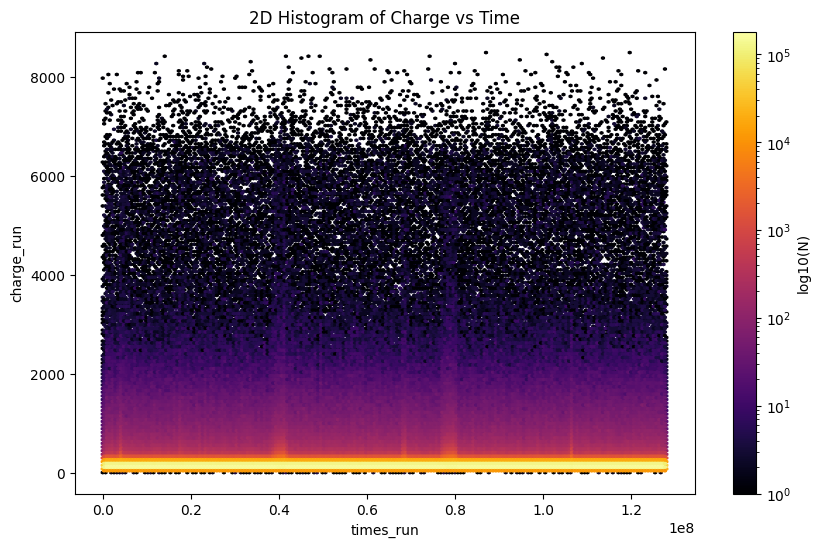

In [12]:
sample_size = 10000  # you can increase if your machine can handle it
indices = np.random.choice(len(times_run), size=sample_size, replace=False)

plt.figure(figsize=(10, 6))
plt.scatter(times_run[indices], charge_run[indices], s=1, alpha=0.5)
plt.xlabel('times_run')
plt.ylabel('charge_run')
plt.title('Scatter Plot of Charge vs Time (subset)')
plt.show()

# 2D Histogram (Density Plot)
plt.figure(figsize=(10, 6))
plt.hexbin(times_run, charge_run, gridsize=200, cmap='inferno', bins='log')
plt.xlabel('times_run')
plt.ylabel('charge_run')
plt.title('2D Histogram of Charge vs Time')
plt.colorbar(label='log10(N)')
plt.show()

In [18]:
times_vals, charge_vals

(array([   407.96563051,    605.7075998 ,   1293.6515918 , ...,
        136097.07265352, 136152.77559134, 136193.60397773],
       shape=(127751441,)),
 array([ 76., 213., 120., ...,  65., 115., 273.],
       shape=(127751441,), dtype=float32))

In [29]:
times_offs, charge_offs

(array([        0,      1089,      2211, ..., 127750003, 127750801,
        127751441], shape=(110058,)),
 array([        0,      1089,      2211, ..., 127750003, 127750801,
        127751441], shape=(110058,)))

(array([10876., 11268., 11178., 10250., 11225., 11038., 10251., 11362.,
        11179., 11431.]),
 array([0.00000000e+00, 1.27751441e+07, 2.55502882e+07, 3.83254323e+07,
        5.11005764e+07, 6.38757205e+07, 7.66508646e+07, 8.94260087e+07,
        1.02201153e+08, 1.14976297e+08, 1.27751441e+08]),
 <BarContainer object of 10 artists>)

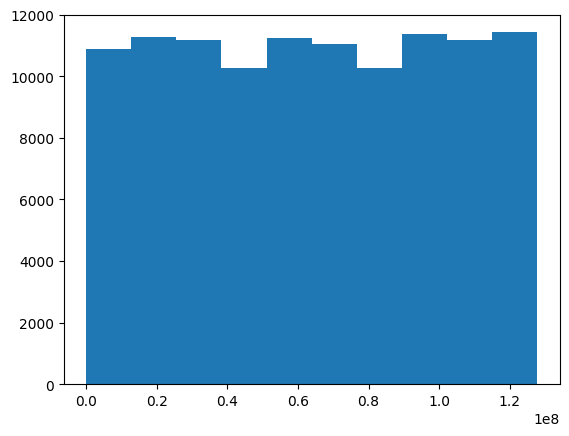

In [27]:
plt.hist(times_offs)

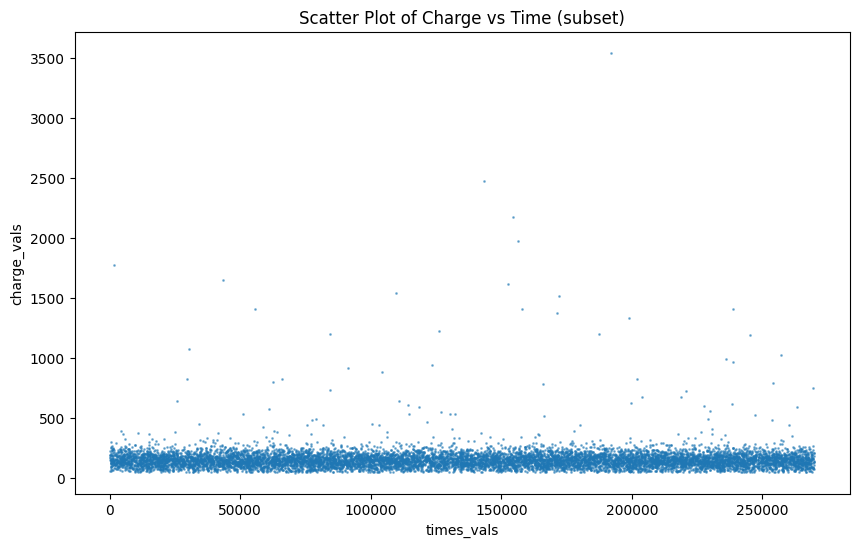

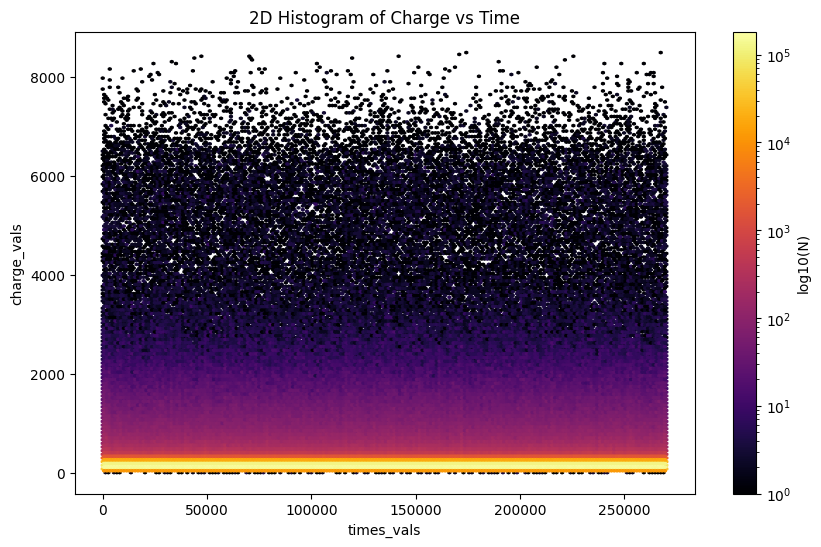

In [31]:
sample_size = 10000  # you can increase if your machine can handle it
indices = np.random.choice(len(times_vals), size=sample_size, replace=False)

plt.figure(figsize=(10, 6))
plt.scatter(times_vals[indices], charge_vals[indices], s=1, alpha=0.5)
plt.xlabel('times_vals')
plt.ylabel('charge_vals')
plt.title('Scatter Plot of Charge vs Time (subset)')
plt.show()

# 2D Histogram (Density Plot)
plt.figure(figsize=(10, 6))
plt.hexbin(times_vals, charge_vals, gridsize=200, cmap='inferno', bins='log')
plt.xlabel('times_vals')
plt.ylabel('charge_vals')
plt.title('2D Histogram of Charge vs Time')
plt.colorbar(label='log10(N)')
plt.show()

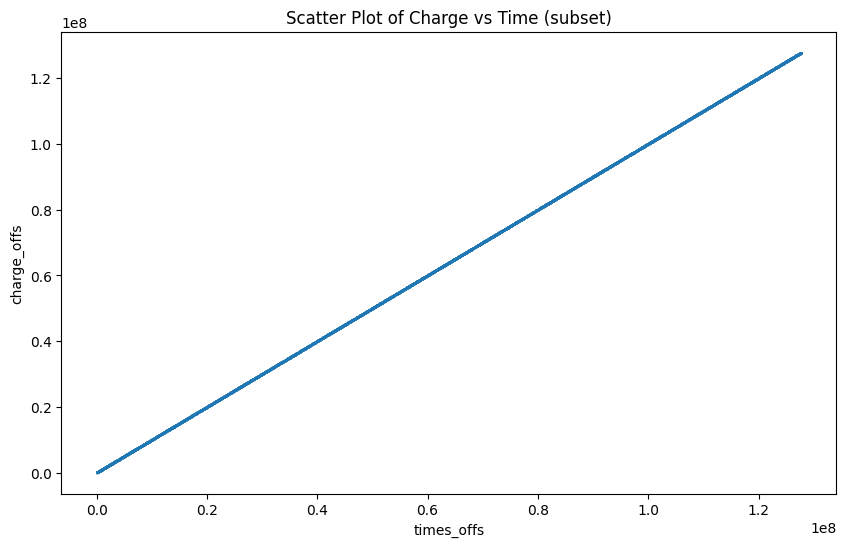

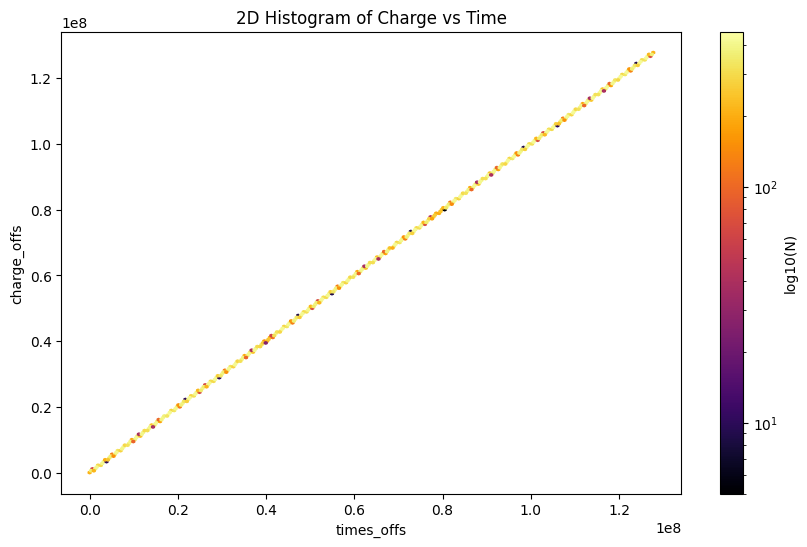

In [32]:
sample_size = 10000  # you can increase if your machine can handle it
indices = np.random.choice(len(times_offs), size=sample_size, replace=False)

plt.figure(figsize=(10, 6))
plt.scatter(times_offs[indices], charge_offs[indices], s=1, alpha=0.5)
plt.xlabel('times_offs')
plt.ylabel('charge_offs')
plt.title('Scatter Plot of Charge vs Time (subset)')
plt.show()

# 2D Histogram (Density Plot)
plt.figure(figsize=(10, 6))
plt.hexbin(times_offs, charge_offs, gridsize=200, cmap='inferno', bins='log')
plt.xlabel('times_offs')
plt.ylabel('charge_offs')
plt.title('2D Histogram of Charge vs Time')
plt.colorbar(label='log10(N)')
plt.show()

In [34]:
def get_global_hit_arrays(times_vals, times_offs, charge_vals, charge_offs):
    """
    Given flattened arrays and offsets, return:
      - global_times: All hit times (already global if input is global)
      - global_charges: All hit charges
      - hit_event_idx: For each hit, the corresponding event index
    """
    n_hits = len(times_vals)
    n_events = len(times_offs) - 1

    # Check for length consistency
    assert n_hits == len(charge_vals)
    assert len(times_offs) == len(charge_offs)

    # Build hit-to-event mapping
    hit_event_idx = np.zeros(n_hits, dtype=int)
    for i in range(n_events):
        start = int(times_offs[i])
        stop  = int(times_offs[i+1])
        hit_event_idx[start:stop] = i

    # Output arrays
    global_times = np.array(times_vals)
    global_charges = np.array(charge_vals)
    return global_times, global_charges, hit_event_idx

# Example usage:
# global_times, global_charges, hit_event_idx = get_global_hit_arrays(times_vals, times_offs, charge_vals, charge_offs)

In [35]:
global_times, global_charges, hit_event_idx = get_global_hit_arrays(times_vals, times_offs, charge_vals, charge_offs)

In [39]:
global_times

array([   407.96563051,    605.7075998 ,   1293.6515918 , ...,
       136097.07265352, 136152.77559134, 136193.60397773],
      shape=(127751441,))

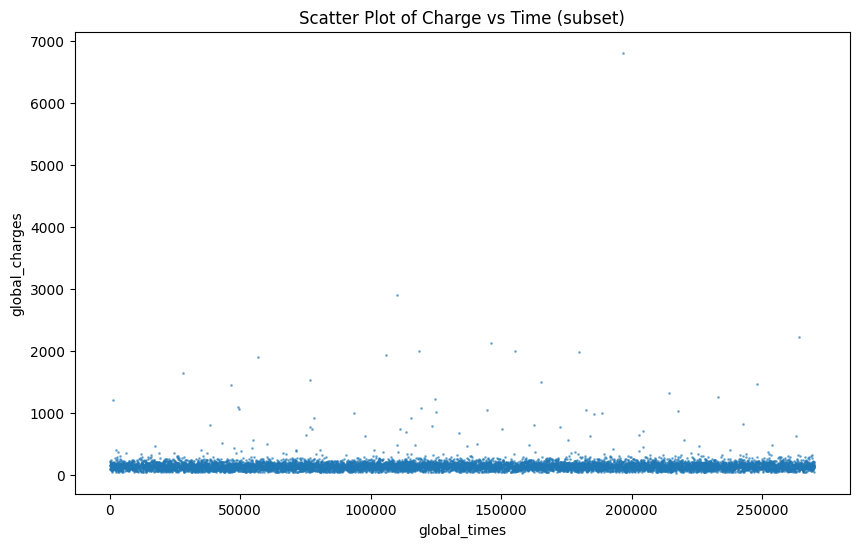

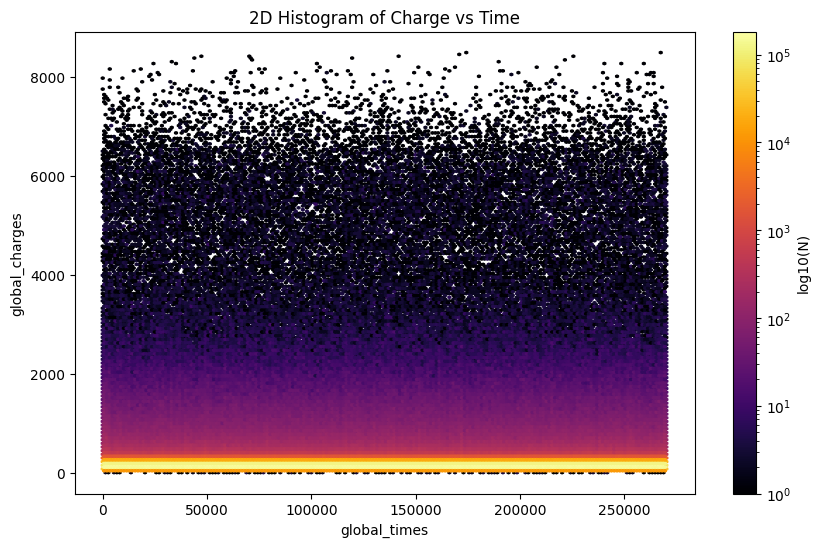

In [38]:
sample_size = 10000  # you can increase if your machine can handle it
indices = np.random.choice(len(global_times), size=sample_size, replace=False)

plt.figure(figsize=(10, 6))
plt.scatter(global_times[indices], global_charges[indices], s=1, alpha=0.5)
plt.xlabel('global_times')
plt.ylabel('global_charges')
plt.title('Scatter Plot of Charge vs Time (subset)')
plt.show()

# 2D Histogram (Density Plot)
plt.figure(figsize=(10, 6))
plt.hexbin(global_times, global_charges, gridsize=200, cmap='inferno', bins='log')
plt.xlabel('global_times')
plt.ylabel('global_charges')
plt.title('2D Histogram of Charge vs Time')
plt.colorbar(label='log10(N)')
plt.show()

In [33]:
times_branch_filtered = functions_analysis.a_lista_de_arrays(valores_read, indices_read)

NameError: name 'valores_read' is not defined

In [35]:
times_branch_filtered[0]

array([   353.57085834,    478.00333567,    702.40670894,    721.08012573,
         2106.45938538,   2158.15177347,   2909.09043655,   3829.13518086,
         3836.38142506,   3923.01567345,   3951.31043076,   4212.24566107,
         5635.22787344,   5683.68426904,   5999.78907386,   6685.91904878,
         6813.54808869,   7924.63618574,   8474.34365301,   9051.23456709,
         9136.10514915,   9209.82619982,   9238.82422931,   9257.31816151,
         9421.38547121,  10372.67739242,  11002.33910758,  11175.99776861,
        11585.10823492,  12077.09160058,  12332.15677291,  12505.78914209,
        12530.30743425,  12648.33235684,  13026.19460157,  13115.82464501,
        14069.42993863,  14451.11726849,  15275.28446074,  16488.36101465,
        16587.21439191,  18173.89387108,  18404.54398065,  18611.55606783,
        19327.95270929,  19651.15287946,  20087.72741936,  20385.22287438,
        20976.30891031,  21055.6435551 ,  21063.49787882,  21393.10859254,
        21497.8452627 ,  

In [5]:
# Light inspection
if isinstance(obj, dict):
    print("Keys (up to 20):", list(obj.keys())[:20])
    for k, v in list(obj.items())[:3]:
        shape = getattr(v, "shape", None)
        print(f"  {k!r}: {type(v).__name__}, shape={shape}")
elif isinstance(obj, (list, tuple)):
    print("Length:", len(obj))
    for i, v in enumerate(obj[:5]):
        shape = getattr(v, "shape", None)
        print(f"  [{i}] {type(v).__name__}, shape={shape}")
else:
    pprint.pprint(obj)

Length: 2
  [0] ndarray, shape=(113659918,)
  [1] ndarray, shape=(157714,)


In [12]:
import numpy as np

times_event   = np.array([100., 150., 210., 310., 505.])
charge_event  = np.array([  1.,   2.,   3.,   4.,   5.])
mpmt_event    = np.array([ 10,   11,   12,   13,   14])

time_prompt    = 200.   # start of prompt window
window_sliding = 150.   # window width

mask_hits = (times_event >= time_prompt) & (times_event < time_prompt + window_sliding)
# mask_hits -> array([False, False,  True,  True, False])

# Use it to select hits inside the window:
times_in_prompt   = times_event[mask_hits]     # array([210., 310.])
charges_in_prompt = charge_event[mask_hits]    # array([3., 4.])
mpmt_in_prompt    = mpmt_event[mask_hits]      # array([12, 13])

# Or get indices:
indices_in_prompt = np.where(mask_hits)[0]     # array([2, 3])


In [15]:
times_in_prompt

array([210., 310.])

In [2]:
run_number = "2386"  # Run number
nhits_threshold = 300  # Threshold for nHits
nhits_window = 5000  # Window for nHits
death_time = 6000  # Death time for nHits

# Paths for files #############################################################################################
root_dir = f"/scratch/halmazan/WCTE/files/data/{run_number}/"
root_file_path = f"{root_dir}WCTE_offline_R2386S0P1.root"
output_path = f"//scratch/halmazan/WCTE/files/data/filtered_files/"
print

<function print>

In [3]:
file = uproot.open(root_file_path)
tree = file["WCTEReadoutWindows"]

In [4]:
tree

<TTree 'WCTEReadoutWindows' (36 branches) at 0x7f72b82100d0>

In [5]:
print(tree.keys())

['window_time', 'start_counter', 'run_id', 'sub_run_id', 'spill_counter', 'event_number', 'readout_number', 'trigger_types', 'trigger_times', 'led_gains', 'led_dacsettings', 'led_ids', 'led_card_ids', 'led_slot_numbers', 'led_event_types', 'led_types', 'led_sequence_numbers', 'led_counters', 'hit_mpmt_card_ids', 'hit_pmt_channel_ids', 'hit_mpmt_slot_ids', 'hit_pmt_position_ids', 'hit_pmt_charges', 'hit_pmt_times', 'pmt_waveform_mpmt_card_ids', 'pmt_waveform_pmt_channel_ids', 'pmt_waveform_mpmt_slot_ids', 'pmt_waveform_pmt_position_ids', 'pmt_waveform_times', 'pmt_waveforms', 'beamline_pmt_qdc_charges', 'beamline_pmt_tdc_times', 'beamline_pmt_qdc_ids', 'beamline_pmt_tdc_ids', 'hit_pmt_calibrated_times', 'hit_pmt_has_time_constant']


In [6]:
tree['window_time'].array()


<Array [5.7e+09, 5.7e+09, ..., 4.59e+10, 4.59e+10] type='2632 * float64'>

In [6]:
times_branch = tree["hit_pmt_calibrated_times"].array()
times_daq_branch = tree["window_time"].array()
charge_branch = tree["hit_pmt_charges"].array()
mpmt_slot_branch = tree["hit_mpmt_slot_ids"].array()
pmt_position = tree["hit_pmt_position_ids"].array()
event_number_branch = tree["event_number"].array(library="np")
hit_cards_id = tree["hit_mpmt_card_ids"].array()
has_time_cte = tree["hit_pmt_has_time_constant"].array()

# Crear una máscara booleana por evento donde ambos valores sean >= 0
valid_mask = (mpmt_slot_branch >= 0) & (pmt_position >= 0) & (charge_branch < 1e4) & (hit_cards_id < 120) &  (has_time_cte != 0)

# Aplicar la máscara a cada rama para eliminar los hits inválidos
times_branch_clean = times_branch[valid_mask]
charge_branch_clean = charge_branch[valid_mask]
mpmt_slot_branch_clean = mpmt_slot_branch[valid_mask]
pmt_position_clean = pmt_position[valid_mask]


In [7]:
times_daq_branch_evt = tree["window_time"].array()
times_daq_branch = []


In [9]:
t0 = times_daq_branch_evt[0]
times_branch[0], times_branch[0]+t0

(<Array [2.07e+04, 2.4e+04, ..., 1.78e+05, 2.65e+05] type='1896 * float64'>,
 <Array [5.7e+09, 5.7e+09, 5.7e+09, ..., 5.7e+09, 5.7e+09] type='1896 * float64'>)

In [21]:
times_daq_branch_evt = tree["window_time"].array()
times_daq_branch = []
for t0 in times_daq_branch_evt:
    times_daq_branch.append(times_branch+t0)


: 

: 

In [ ]:
times_daq_branch

In [18]:
times_daq_branch_clean = times_daq_branch[valid_mask]

2632

In [12]:
len(times_daq_branch)

2632

In [10]:
valid_mask

<Array [[True, True, True, ..., False, False], ...] type='2632 * var * bool'>

In [62]:
start_counter = tree['window_time'].array(library="np")
for i in range(1,len(start_counter)):
    print(start_counter[i]-start_counter[i-1])

277752.0
277752.0
277752.0
277752.0
277752.0
277744.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277744.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277744.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277744.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277744.0
277760.0
277744.0
277760.0
277752.0
277752.0
277744.0
277760.0
277736.0
277752.0
277760.0
277752.0
277752.0
277744.0
277752.0
277760.0
277752.0
277752.0
277744.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277744.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277744.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277744.0
277752.0
277744.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277760.0
277736.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277752.0
277744.0
277752.0
2

In [54]:
start_counter = tree['window_time'].array(library="np")
event_number = tree['event_number'].array(library="np")
time_start_counter = max(start_counter)-min(start_counter)
print(time_start_counter, max(event_number)*277752.0)

499674320.0 298583400.0


In [34]:
tree['event_number'].array()

<Array [0, 1, 2, 3, 4, ..., 1071, 1072, 1073, 1074, 1075] type='1076 * int32'>